# Spatial deconvolution
```{dropdown} <i class="fas fa-brain"></i>&nbsp;&nbsp;&nbsp;Key takeaways

:::{card}
:link: spatial-deconvolution-key-takeaway-1
:link-type: ref
Reference based deconvolution methods can be used for increasing the resolution of spot-based spatial transcriptomics data.
:::

:::{card}
:link: spatial-deconvolution-key-takeaway-2
:link-type: ref
Cell2location outperformed other approaches for cell type deconvolution, but requires more computational resources.
:::

:::{card}
:link: spatial-deconvolution-key-takeaway-3
:link-type: ref
Alternative models are SpatialDWLS and RCTD which perform best in terms of the overall accuracy score.
:::

```
``````{dropdown} <i class="fa-solid fa-gear"></i>   Environment setup
`````{tab-set}

````{tab-item} Steps
```{include} ../_static/default_text_env_setup.md
```
````

````{tab-item} yml
```{literalinclude} spatial.yml
:language: yaml
```
````

`````
``````
<!-- END DROPDOWNS -->


(spatial-deconvolution-key-takeaway-1)=
## Motivation

Spot-based spatial transcriptomics data extends the classical readout from dissociated single-cell RNA sequencing with spatial locations. While still being sequencing based, and therefore unbiased in gene space, available methods do not have single-cell resolution. Visium, the commercial version of the original Spatial Transcriptomics protocol, for example, has circular capture areas with a diameter of 55mu. Dependent on the tissue and spatial location multiple cells map onto a single capture area. In addition, a single cell might only be partly contained within the capture area, leading to further differences from the expression profiles we are used to when dealing with classical scRNA-seq data. 

Since the biological entity of interest are single cells, we would like to demix the observed spatial expression profiles back to signals from individual cells. This process is referred to as deconvolution. Deconvolution comes in multiple flavours. The simplest form of deconvolution is to assign proportions of cell types to each spatial location. A more complex approach is to also identify within cell-type variation. Since spatial data by itself does not provide a clear notion of cell type, deconvolution methods usually rely on a single-cell reference. 

While the alignment of reference data with the spatial data can be done in different ways, a very popular approach is to perform a probabilistic mapping where mixture parameters are inferred such that compositions of single-cell expression profiles match the spatial expression. 

In this tutorial, we will describe two approaches, Stereoscope {cite}`andersson_single-cell_2020` and Cell2Location {cite}`kleshchevnikov_cell2location_2022`, in more detail and provide a practical tutorial for one of them. We further name a few other methods which are worth testing when encountering the problem of deconvolution.

## A more mathematical description of deconvolution

Spatial deconvolution is a rather complex approach that requires some understanding of the underlying methods. This section aims to explain the mathematical concepts of the task at hand. Readers only interested in how to apply deconvolution in practice can directly jump to the section **Cell2location in practice**.

In spatial transcriptomics, the observed transcriptome can be described as a latent variable model. The observed counts $x_{sg}$ for gene $g$ and spot $s$ is the sum of the cells' contributions $x_{sig}$ that belong to this spot:

$$x_{sg} = \sum_{i=1}^{C(s)} x_{sig} \quad .$$

If one ignores the variability within cell types, the problem of deconvolution simplifies to the identification of counts of cell types, that is to infer how often a cell type occurs $\tilde \beta_{st}$ in each spot:

$$x_{sg} = \sum_{i=1}^{C(s)} c_{t(i)g} = \sum_{t=1}^{T} \beta_{st} c_{tg} \quad ,$$

where $t(i)$ is cell's $i$ cell type and $c_{tg}$ the prototype expression profiles. Note that the sum changes from summing over individual cells $i$ to summing over the distinct set of cell types $t \in \{1, \dots, C\}$. Here, the parameter $\tilde \beta_{st}$ counts how often a cell type occurs in a spot. Through normalisation of the spot's library size $l_s$, this count vector can be changed to indicate cell type proportions:

$$x_{sg} = l_s \sum_{t=1}^{T} \beta_{st} c_{tg} \quad .$$

This problem of identifying cell type proportions $\beta_{st}$ is not easy to solve. One reason for this is limited number of spots within a dataset, usually 3-5k, while measuring almost all protein encoding genes of the human genome, $> 20\text{k}$.

Using reference scRNA-seq measurements, is a good way to alleviate this issue. Their single-cell resolution enables to compute the prototype expression profiles $\boldsymbol{c}_{t}$. Knowing such prototypes reduces the above problem to finding the cell type proportions $\beta_{st}$ within spots. Of course, such a transfer across technologies is only sensible if one can assume that the scRNA-seq profiles are representable for the measured counts in the spatial assay. Ideally, both experiments were conducted on the same tissue slice. 

Over the past two years, multiple methods were introduced that tackle the problem of deconvolution in spatial transcriptomics data. Among others, there are Stereoscope {cite}`andersson_single-cell_2020`, DestVI {cite}`lopez_destvi_2022`, RCTD {cite}`cable_robust_2022`, SPOTlight {cite}`elosua-bayes_spotlight_2021`, and Cell2Location {cite}`kleshchevnikov_cell2location_2022` which we will describe in more detail for exemplary purposes.

(spatial-deconvolution-key-takeaway-3)=
### Stereoscope

Stereoscope {cite}`andersson_single-cell_2020` is a reference deconvolution model, which uses the negative binomial distribution to model both single cell and spatial transcriptomics expression data. It makes the simplifying assumption, that gene expression of cells of one cell type is constant, not just within one spot but globally in the entire dataset:

$$c_{tsg} = c_{ts'g} \ \ , \quad  \forall s,s' \in \{1, ..., N_s\} \quad .$$

Stereoscope uses the above formulation as the rate parameter of a negative binomial distribution and extends it by two additional parameters. First, in order to model the technology dependent capture efficiencies of different genes, they introduce the capture efficiency parameter $e_g$. In addition, they introduce the second parameter of the negative binomial distribution, the success probability $p_g$. This parameter is considered to be shared between genes (this ensures that the $NB$ distribution is closed under summation):

$$x_{sg} \sim NB(l_s e_g \sum_{t=1}^{T} \beta_{st} c_{tg}, p_g) \quad .$$

The expression profiles $c_{tg}$ as well as the success probabilities $p_g$ are obtained from the cell expressions $y_{ig}$ of a reference dataset: 

$$y_{ig} \sim NB(d_i c_{tg},p_g) \quad ,$$

where $d_c = \sum_{g = 1}^G y_{ig}$ is the count depth, i.e. the total number of a cell's transcripts.

As a technical adjustment, a dummy cell type is considered for each spot to model additive shifts between technologies due to differences in the underlying cell types. The final Stereoscope model becomes: 

$$x_{sg} \sim NB(l_s e_g \sum_{t=1}^{T} \beta_{st} c_{tg} + \kappa_s \epsilon_g, p_g) \quad $$


### Cell2location

Another deconvolution model which uses the negative binomial distribution is Cell2Location {cite}`kleshchevnikov_cell2location_2022`. In contrast to Stereoscope, it uses the mean parameterisation of the negative binomial. The cell counts for each cell type are modeled directly via the mean $\mu_{sg}$ and the dispersion $a_g$, which is also shared between genes. Additionally, technical parameters $l_s$, $e_g$ and $\epsilon_g$ are used as in Stereoscope to account for multiplicative and additive shift:

$$x_{sg} \sim {NB}(\mu_{sg}, a_g) =  {NB}(l_s (e_g \sum_{t=1}^{T} \beta_{st} c_{stg} + \epsilon_g), a_g)$$

Note that Cell2Location also considers batch and technology effects from using data collected over multiple batches. In order to make the comparison between the models shown easier, this will not be considered here.

In order to regularize parameters, Cell2location makes extensive use of priors which are supposed to match their biological meaning closely. All parameters of the spatial and reference model have priors of some form which are constructed in a hierarchical fashion. This means that the parameters of the prior distributions have themselves priors. Details can be found in the supplementary information of the original publication.

A particularly interesting modeling assumption is that the abundance of cell types $\beta_{st}$ itself is modelled as a linear combination of cell type prototypes $\rho_{r}$ (or tissue prototypes). These are modeled to be distributed on the slide with proportion $\pi_s$. This is expressed in a gamma prior with (fixed) prior strength parameter $v$:

$$\beta_{st} \sim \text{Gamma}\big((\mu_{sf} v , v)\big) = \text{Gamma}\Big(\Big(\sum_{r=1}^R \pi_{sf} \rho_{fr} v , v\Big)\Big)$$

As a reference-based model, Cell2location also relies on scRNA-seq measurements for the cell type profiles $\boldsymbol{c}_t$. The single-cell model is quite similar to the one of Stereoscope but is mean-parametrised and further includes the technical parameter $\hat{\epsilon}_g$:

$$ y_{cg} \sim {NB}(\mu_{cg}, \hat{a}_g)=  {NB}(\beta_{tg} + \hat{\epsilon}_g , \hat{a}_g)$$

The posteriors of the hierarchical models shown here are all intractable. Thus variational inference is used in Cell2Location to infer the full posteriors.

(spatial-deconvolution-key-takeaway-2)=
## Cell2Location in practice

An independent benchmark{cite}`li_benchmarking_2022` showed that for simulated datasets cell2location outperformed other approaches for cell type deconvolution, but requires more computational resources. For real datasets, SpatialDWLS and RCTD performed best in terms of the overall accuracy score based on four different accuracy metrics. 

The tutorial presented here follows parts of the tutorials available on the [cell2location documentation](https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_tutorial.html#Visualising-cell-abundance-in-spatial-coordinates). Compared to other deconvolution methods cell2location requires more computational resources, especially on large datasets with many cells and cell types. The tutorial presented here was run with GPU access.

The dataset we are using here measures different physiological zones and timepoints of human myocardial infarction and human control myocardium with 10x Visium {cite}`kuppe_spatial_2022`. Kuppe et al. also profiled single-cell gene expression with snRNA-seq which we will use as reference dataset in this tutorial. 


:::{figure-md} deconvolution

<img src="../_static/images/spatial/deconvolution.jpeg" alt="Deconvolution Overview" class="bg-primary mb-1" width="800px">

Cell2location requires a single-nucleus or single-cell RNA-seq reference dataset on which one first applies gene selection with permissive thresholds. In a second step, one estimates the cell type signatures in the references dataset. The default model is a negative binomial regression which robustly combines data across technologies and batches. Along with the reference dataset, one requires a spatial dataset of one or multiple batches. The third step is then performing the actual cell type mapping with cell2location which estimates the cell type abundance per spot. The learnt abundance and cell-type specific expression per spot can then be used for downstream analysis tasks.

:::

We are starting with importing respective packages

In [1]:
import cell2location as c2l
import matplotlib
import scanpy as sc
import squidpy as sq

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, facecolor="white")

[rank: 0] Global seed set to 0


### Pre-processing of the spatal and single-cell data

Let us first inspect the two datasets we will leverage in this tutorial. We start with the spatial dataset for which we selected the four control samples from Kuppe et al.{cite}`kuppe_spatial_2022`.

In [2]:
adata_st = sc.read(
    filename="kuppe_visium_human_heart_2022_control.h5ad",
    backup_url="https://figshare.com/ndownloader/files/39347357",
)
adata_st

try downloading from url
https://figshare.com/ndownloader/files/39347357
... this may take a while but only happens once


  0%|          | 0.00/212M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 11725 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'patient', 'patient_region_id', 'patient_group', 'major_label', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

We can inspect the dataset and the associated four images with squidpy and it's `pl.spatial_scatter` function.

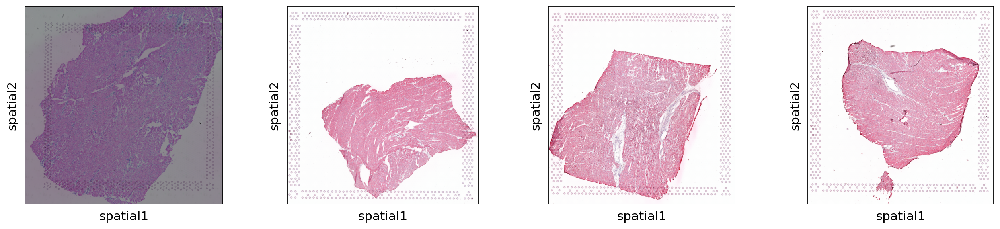

In [3]:
sq.pl.spatial_scatter(adata_st, library_key="patient_region_id")

The function returns one plot for each histological image present in the dataset. Each sample comes from one patient in the control group and looks substantially different when just observing the image representation. 

Next, we load the reference dataset. In this case, we leverage the single-nucleus RNA sequencing also published by Kuppe et al. {cite}`kuppe_spatial_2022` with 41,663 nuclei measured across four control patients.

In [4]:
adata_sc = sc.read(
    filename="kuppe_snRNA_human_heart_2022_control.h5ad",
    backup_url="https://figshare.com/ndownloader/files/39347573",
)
adata_sc

try downloading from url
https://figshare.com/ndownloader/files/39347573
... this may take a while but only happens once


  0%|          | 0.00/3.00G [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 41663 × 29046
    obs: 'sample', 'n_counts', 'n_genes', 'percent_mito', 'doublet_score', 'dissociation_score', 'patient_region_id', 'donor_id', 'patient_group', 'major_labl', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_type', 'cell_type_original'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: 'X_approximate_distribution', 'batch_condition', 'cell_type_colors', 'cell_type_original_colors', 'default_embedding', 'schema_version', 'title'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'counts', 'normalized_counts'

The control reference dataset is already processed and annotated with the identified cell types. We will use the original cell type label throughout the notebook and reset `adata_sc.X` to the raw counts stored in layers.

Additionally, we can inspect the data in the stored UMAP embedding to better visualize what cell types are present in the reference.

/home/icb/anna.schaar/miniconda3/envs/deconvolution_book/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


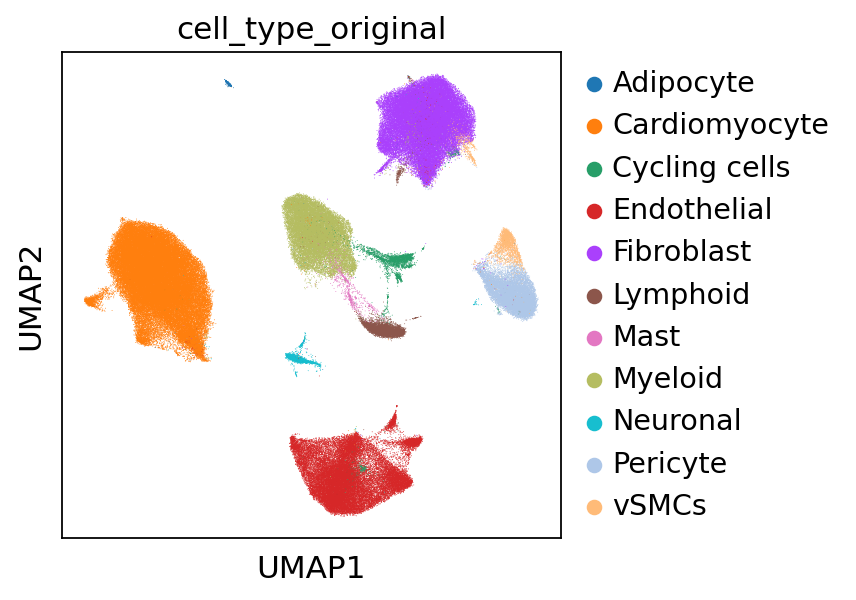

In [6]:
adata_sc.X = adata_sc.layers["counts"]

sc.pl.umap(adata_sc, color="cell_type_original")

We observe the cell types adipocytes, cardiomyocyte, cycling cells, endothelial, fibroblast, lymphoid, mast, myeloid, neuronal, pericyte and vSMCs. Cell2location aims to deconvolve the spots in the spatial data in accordance to the above displayed cell types. 

For performing the deconvolution, Cell2location requires ENSEMBL gene identifiers to be stored in `adata_st.var_names` to accurately map between single cell and spatial data. Let us inspect whether this is already given:

In [7]:
adata_st.var.head()

,gene_ids,feature_types,genome
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38
FAM138A,ENSG00000237613,Gene Expression,GRCh38
OR4F5,ENSG00000186092,Gene Expression,GRCh38
AL627309.1,ENSG00000238009,Gene Expression,GRCh38
AL627309.3,ENSG00000239945,Gene Expression,GRCh38


We can see that `adata_st.var_names` are feature names instead of ENSEMBL gene identifiers. So, we are saving feature names into a new column in `adata_st.var` and replace the index of var by the gene identifiers.

In [8]:
adata_st.var["feature_name"] = adata_st.var_names
adata_st.var.set_index("gene_ids", drop=True, inplace=True)

As we can see, ENSEMBL gene identifiers are now correctly stored in `adata_st.var_names`.

In [9]:
adata_st.var.head()

,feature_types,genome,feature_name
gene_ids,,,
ENSG00000243485,Gene Expression,GRCh38,MIR1302-2HG
ENSG00000237613,Gene Expression,GRCh38,FAM138A
ENSG00000186092,Gene Expression,GRCh38,OR4F5
ENSG00000238009,Gene Expression,GRCh38,AL627309.1
ENSG00000239945,Gene Expression,GRCh38,AL627309.3


Before we perform the spatial mapping with cell2location, it is recommended to remove mitochondrial genes from the dataset as they represent technical artifacts rather than biological abundance of mitochondria. The dataset considered here is from humans, hence mitochondrial genes are encoded with the prefix `MT-`. We can subset all mitochondrial genes and move them to `.obsm['MT']` to ensure they are still available in case one needs them for any other downstream analysis.

In [10]:
# find mitochondrial (MT) genes
adata_st.var["MT_gene"] = [
    gene.startswith("MT-") for gene in adata_st.var["feature_name"]
]

# remove MT genes for spatial mapping (keeping their counts in the object)
adata_st.obsm["MT"] = adata_st[:, adata_st.var["MT_gene"].values].X.toarray()
adata_st = adata_st[:, ~adata_st.var["MT_gene"].values]

Next, we subset both datasets to the same gene set which is the baseline for the mapping between the single cell and spatial data.

In [11]:
shared_features = [
    feature for feature in adata_st.var_names if feature in adata_sc.var_names
]
adata_sc = adata_sc[:, shared_features].copy()
adata_st = adata_st[:, shared_features].copy()

### Fitting the reference model

The first step when running cell2location is to fit the reference model which estimates the reference cell type signature. To ensure the reference is of high quality, cell2location recommends to perform a very permissive gene selection. For this purpose, one can use the function `filter_genes` with the default parameters `cell_count_cutoff=5`, `cell_percentage_cutoff2=0.03`, `nonz_mean_cutoff=1.12`. These parameters are a good starting point, but can also be adjusted depending on the dataset at hand. For more information on how to select these filtering parameters, we refer the reader to cell2location's documentation.

/home/icb/anna.schaar/miniconda3/envs/deconvolution_book/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


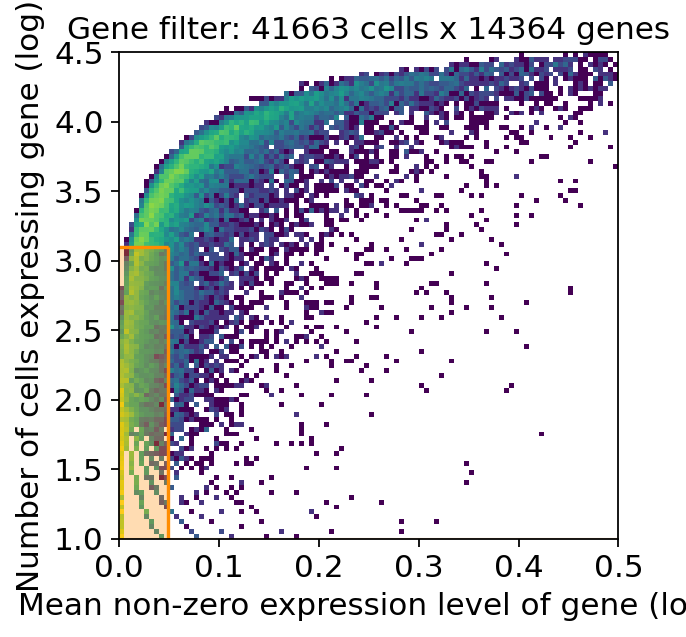

In [12]:
selected = c2l.utils.filtering.filter_genes(
    adata_sc, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12
)

The respective function returns a 2D histogram, where the orange rectangle indicated genes that are excluded based on the defined threshold. The Y-axis shows the number of cells expressing that gene and the X-axis the average RNA count for cells with a detected gene.

We can now subset both AnnData objects to the selected genes:

In [13]:
adata_sc = adata_sc[:, selected].copy()
adata_st = adata_st[:, selected].copy()

Cell2location estimates the signatures from the reference data using a Negative Binomial regression model which can also account for batch effects and additional categorical covariates. We are passing the `donor_id` and the `assay` as batch and covariate in this tutorial. `setup_anndata` will create the data object that is actually used for training the model.

In [14]:
c2l.models.RegressionModel.setup_anndata(
    adata=adata_sc,
    batch_key="donor_id",
    labels_key="cell_type_original",
    categorical_covariate_keys=["assay"],
    layer="counts",
)

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


We can now train the regression model and estimate the reference cell type signatures. The default number of epochs is `max_epochs=250`, which might need to be increased to achieve convergence for the dataset at hand. 

Additionally, one might inspect that `batch_size=2500` which is much larger compared to other defaults in scvi-tools and that `train_size=1` which performs training on all cells present in the dataset.

In [15]:
model = c2l.models.RegressionModel(adata_sc)
# default, try on GPU:
use_gpu = True
model.train(max_epochs=250, batch_size=2500, train_size=1, lr=0.002, use_gpu=use_gpu)

/home/icb/anna.schaar/miniconda3/envs/deconvolution_book/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:166: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/anna.schaar/miniconda3/envs/deconvolution_ ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/icb/anna.schaar/miniconda3/envs/deconvolution_book/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:166: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/anna.schaar/miniconda3/envs/deconvolution_ ...
  rank_zero_warn(
/home/icb/anna.schaar/mi

Epoch 250/250: 100%|██████████████████| 250/250 [13:19<00:00,  3.14s/it, v_num=1, elbo_train=2.95e+8]

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|██████████████████| 250/250 [13:19<00:00,  3.20s/it, v_num=1, elbo_train=2.95e+8]


By inspecting the training history, one can determine whether the model needs more training. This plot should have a decreasing trend and should level off, otherwise one needs to increase the `max_epochs` parameter.

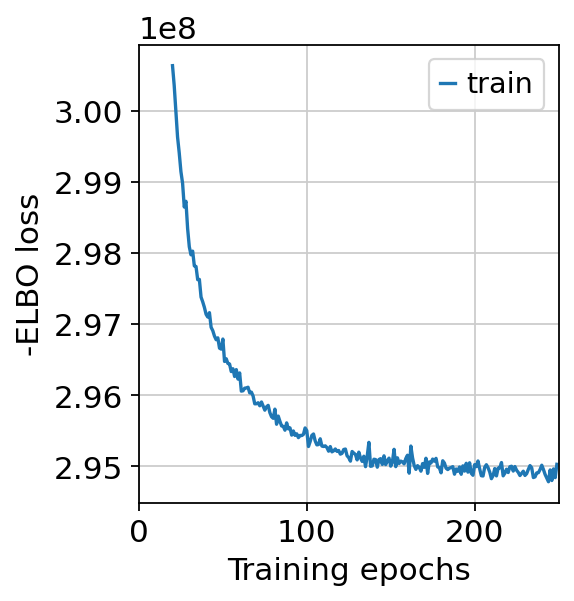

In [16]:
model.plot_history(20)

By looking at the training history, we actually inspect that the loss curve is decreasing and leveling off. This indicates that the model converged.

As a next step, cell2location summarises the posterior distribution by exporting the learned cell abundances to the anndata object. Specifically it computes the 5%, 50% and 95% quantiles of the expression signatures in each cell type in the reference dataset.

In [17]:
model.export_posterior(
    adata_sc,
    sample_kwargs={"num_samples": 1000, "batch_size": 2500, "use_gpu": use_gpu},
)

Sampling global variables, sample: 100%|██████████████████████████| 999/999 [00:09<00:00, 103.17it/s]


AnnData object with n_obs × n_vars = 41663 × 14364
    obs: 'sample', 'n_counts', 'n_genes', 'percent_mito', 'doublet_score', 'dissociation_score', 'patient_region_id', 'donor_id', 'patient_group', 'major_labl', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_type', 'cell_type_original', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'n_cells', 'nonz_mean'
    uns: 'X_approximate_distribution', 'batch_condition', 'cell_type_colors', 'cell_type_original_colors', 'default_embedding', 'schema_version', 'title', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'X_harmony', 'X_pca', 'X_umap', '_scvi_extra_categorical_covs'
    varm: 'means_per_cluster_mu_fg', 'stds_per_cluster_mu_fg', 'q05_per_cluster_mu_fg', 'q95_per_cluster_mu_fg'
    layers: 'counts', 'normalized_counts'

Cell2location provides a function for quality control of the model fit. Two plots are generated, showing:

1. the reconstruction accuracy. This plot should have most observations along a noisy diagonal.

2. the estimated expression signatures, which should also be mainly have observations along the diagonal.


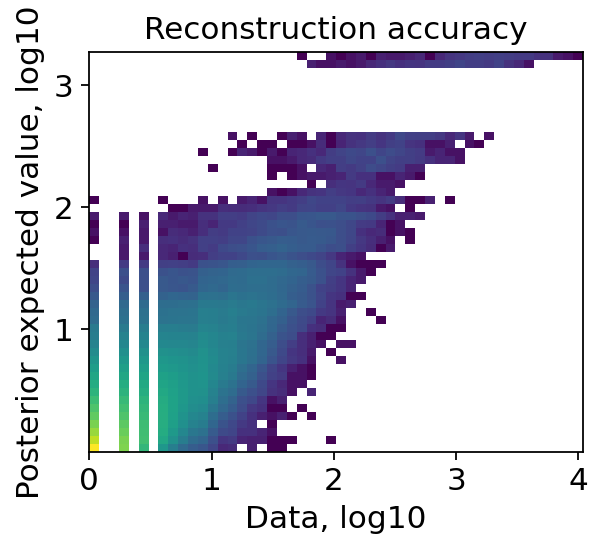

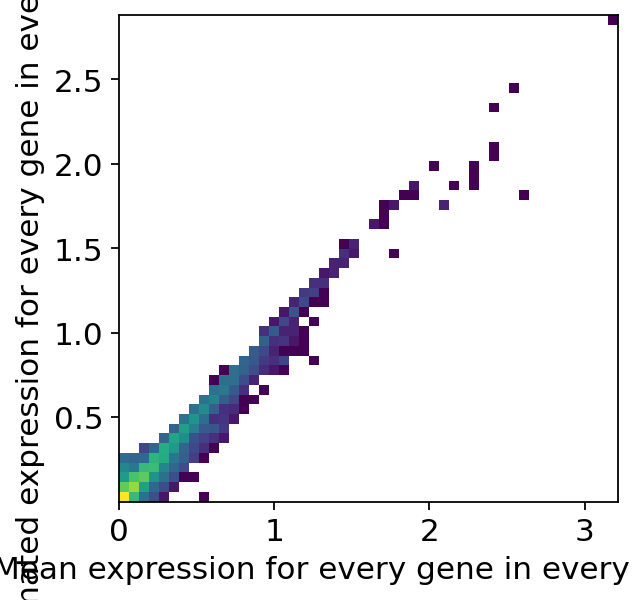

In [18]:
model.plot_QC()

We can see in the quality control plots that the reconstruction accuracy and the estimated expression signatures are both roughly forming a diagonal. We can now continue with our analysis and extract the inferred cell types signatures. For the subsequent spatial mapping, cell2location needs the estimated gene expression in every cell type. 

In [19]:
# export estimated expression in each cluster
if "means_per_cluster_mu_fg" in adata_sc.varm.keys():
    inf_aver = adata_sc.varm["means_per_cluster_mu_fg"][
        [f"means_per_cluster_mu_fg_{i}" for i in adata_sc.uns["mod"]["factor_names"]]
    ].copy()
else:
    inf_aver = adata_sc.var[
        [f"means_per_cluster_mu_fg_{i}" for i in adata_sc.uns["mod"]["factor_names"]]
    ].copy()

inf_aver.columns = adata_sc.uns["mod"]["factor_names"]
inf_aver.head()

,Adipocyte,Cardiomyocyte,Cycling cells,Endothelial,Fibroblast,Lymphoid,Mast,Myeloid,Neuronal,Pericyte,vSMCs
feature_id,,,,,,,,,,,
ENSG00000237491,0.345130,0.087746,0.132866,0.026051,0.076892,0.022174,0.040034,0.037086,0.041302,0.026012,0.059664
ENSG00000228794,0.311184,0.854350,0.055324,0.044600,0.045747,0.051093,0.071472,0.048005,0.055801,0.040259,0.082158
ENSG00000188976,0.127703,0.162105,0.104626,0.017800,0.082823,0.040612,0.026912,0.038888,0.019028,0.033144,0.064095
ENSG00000187642,0.058162,0.513303,0.014339,0.010231,0.006430,0.003457,0.029488,0.009087,0.003172,0.007707,0.007055
ENSG00000188290,0.061855,0.122690,0.017265,0.083241,0.069586,0.013826,0.019374,0.008620,0.053345,0.413005,0.512525



If you are running deconvolution on multiple slides for the same reference dataset, it might be reasonable to save the cell types' signatures.

In [20]:
inf_aver.to_csv("inf_aver.csv")

### Cell2Location cell type mapping

Next, we can prepare the data for the actual spatial mapping with `setup_anndata` for the Cell2location model.

In [21]:
c2l.models.Cell2location.setup_anndata(
    adata=adata_st,
    batch_key="patient",
)

Cell2location requires two user-provided hyperparameters (`N_cells_per_location` and `detection_alpha`). 

* `N_cells_per_location` describes the expected cell abundance in each location or spot. This can usually be obtained through paired histology images. We will use `N_cells_per_location=8` in this tutorial.

* `detection_alpha` handles the technical variability in RNA detection sensitivity within the slide/batch. The technical variability in RNA detection sensitivity can also be extracted based on histological examination. For more information we refer the analyst to the documentation of cell2location. The default value is `detection_alpha=20`.

Cell2location provides a detailed note on how to determine the model hyperparameters, which can be accessed [here](https://github.com/BayraktarLab/cell2location/blob/master/docs/images/Note_on_selecting_hyperparameters.pdf).

In [22]:
model = c2l.models.Cell2location(
    adata_st,
    cell_state_df=inf_aver,
    N_cells_per_location=8,
)
model.view_anndata_setup()

Anndata setup with scvi-tools version 0.20.0.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'patient',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   4   │
│         n_cells          │ 11725 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 14364 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location    ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['patient'] │     P1     │          0          │
│                      │     P7     │          1          │
│                      │     P8     │          2          │
│                      │    P17     │          3          │
└──────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

We can now train cell2location and perform the spatial mapping. We will use the following default parameters for training: `max_epochs=30000`, `batch_size=None` and `train_size=1` indicating that all data points are used in training as all cell abundances are estimated in all spots. Additionally, we can again inspect the training history after fitting the model. The training history should again have a decreasing trend and should level off, otherwise increasing `max_epochs` might help.

/home/icb/anna.schaar/miniconda3/envs/deconvolution_book/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:166: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/anna.schaar/miniconda3/envs/deconvolution_ ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/icb/anna.schaar/miniconda3/envs/deconvolution_book/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:166: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/anna.schaar/miniconda3/envs/deconvolution_ ...
  rank_zero_warn(
/home/icb/anna.schaar/mi

Epoch 30000/30000: 100%|████████| 30000/30000 [1:16:21<00:00,  6.51it/s, v_num=1, elbo_train=5.59e+7]

`Trainer.fit` stopped: `max_epochs=30000` reached.


Epoch 30000/30000: 100%|████████| 30000/30000 [1:16:21<00:00,  6.55it/s, v_num=1, elbo_train=5.59e+7]


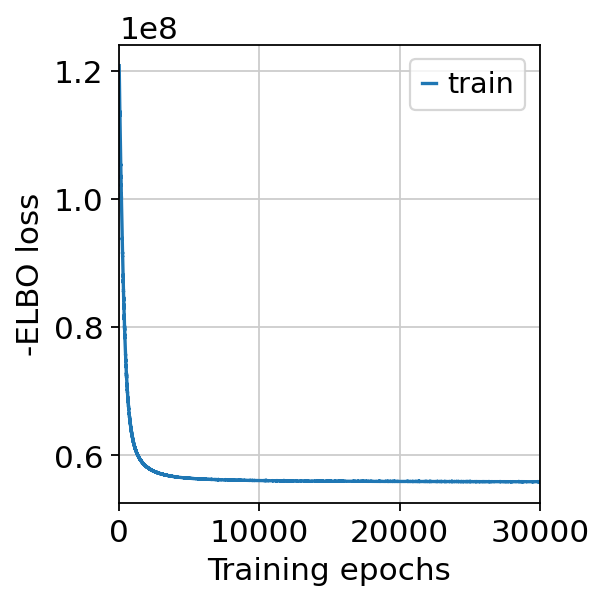

In [23]:
model.train(max_epochs=30000, batch_size=None, train_size=1, use_gpu=use_gpu)
# plot training history
model.plot_history()

Again, we see that the training history levels off and the model converged. We can now export the estimated cell type wise abundance in each spot and save it into the spatial data by sampling from the posterior distribution.

In [24]:
adata_st = model.export_posterior(
    adata_st,
    sample_kwargs={
        "num_samples": 1000,
        "batch_size": model.adata.n_obs,
        "use_gpu": use_gpu,
    },
)

Sampling global variables, sample: 100%|███████████████████████████| 999/999 [00:27<00:00, 36.86it/s]


We can again inspect the reconstruction accuracy, which should roughly show points around a noisy diagonal.

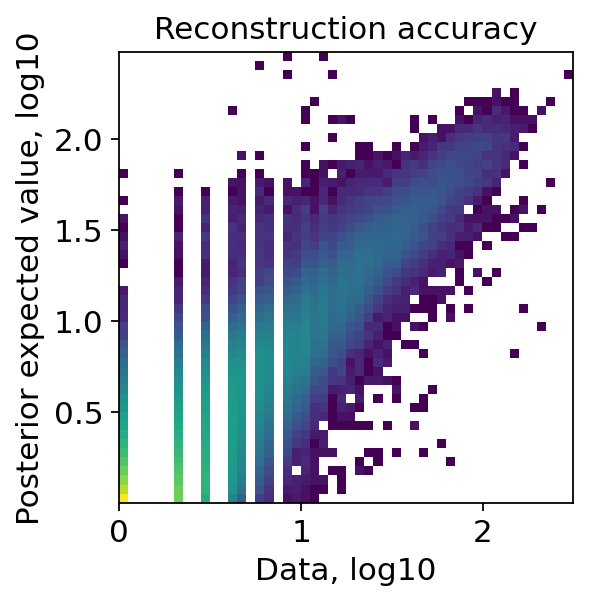

In [25]:
model.plot_QC()

As we can see the reconstruction accuracy roughly shows a diagonal, so we can continue with the analysis and inspecting the results.

We can now visualize the cell abundance mapped to the spatial coordinates. In this case we are using the 5% quantile of the posterior distribution, which represents that the model has a high confidence and at last 5% are present.

In [26]:
adata_st.obs[adata_st.uns["mod"]["factor_names"]] = adata_st.obsm[
    "q05_cell_abundance_w_sf"
]

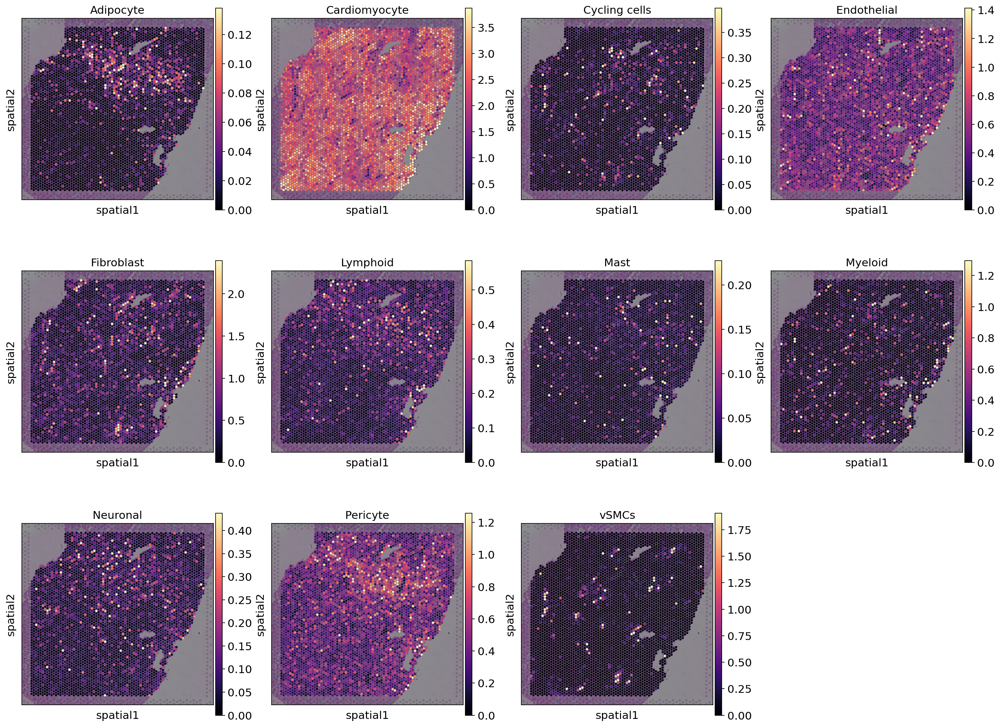

In [27]:
# select one slide for visualization
slide = c2l.utils.select_slide(adata_st, "control_P1", batch_key="patient_region_id")

with matplotlib.rc_context({"figure.figsize": [4.5, 5]}):
    sc.pl.spatial(
        slide,
        cmap="magma",
        color=adata_st.uns["mod"]["factor_names"],
        ncols=4,
        size=1.3,
        img_key="hires",
        # limit color scale at 99.2% quantile of cell abundance
        vmin=0,
        vmax="p99.2",
    )

As one can see, the estimated cell type abundances vary between spots and cell types. Cardiomyocytes seem to be present in most spots while some cell types only appear in a few spots.

We can additionally visualize multiple cell types in one panel.

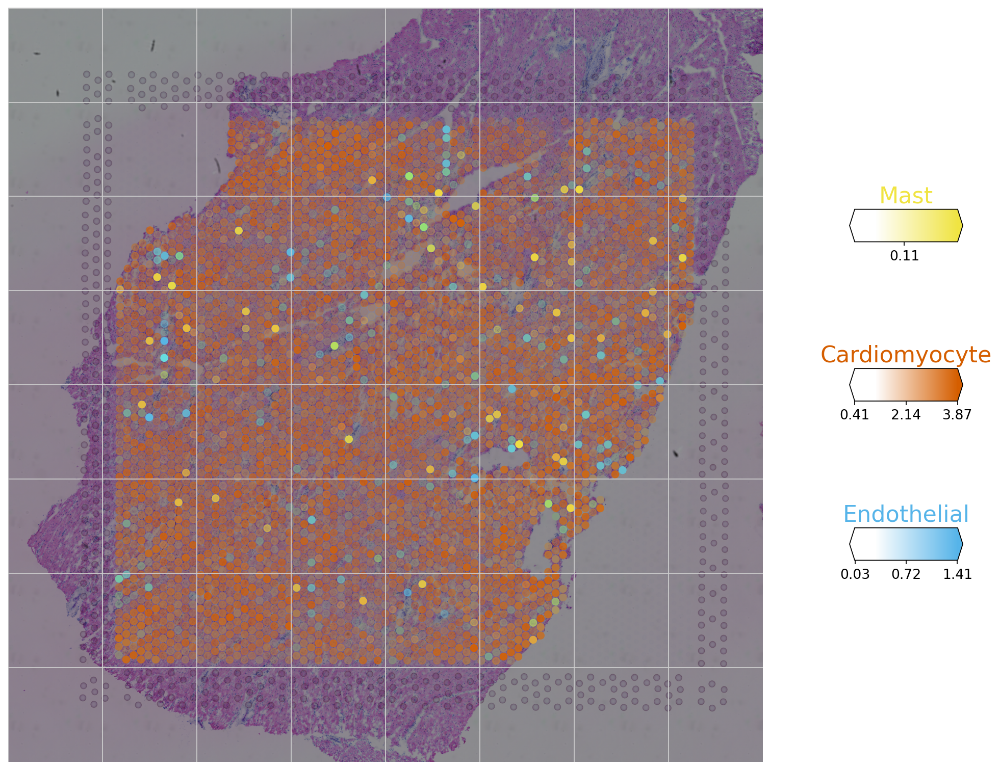

In [28]:
clust_col = ["Mast", "Cardiomyocyte", "Endothelial"]
clust_labels = clust_col

with matplotlib.rc_context({"figure.figsize": (15, 15)}):
    fig = c2l.plt.plot_spatial(
        adata=slide,
        color=clust_col,
        labels=clust_labels,
        max_color_quantile=0.992,
        circle_diameter=6,
        show_img=True,
        colorbar_position="right",
        colorbar_shape={"horizontal_gaps": 0.2},
    )

The plot helps to identify the main cell types in the spots and assess which cell type might mainly be present in one spot. For example, we can observe that most spots are mainly formed by cardiomyocytes, but a few are also mainly composed of endothelial or mast cells. 

### Downstream analysis

#### Cell-type specific expression of every gene in the spatial data
Cell2location can additionally compute the posterior distribution of the cell type specific expression. This step extracts the cell-type specific expression of every gene at every spatial location in the spatial data. The cell-type specific expression is saved for each cell type as an additional layer to the spatial data object.

In [29]:
# Compute expected expression per cell type
expected_dict = model.module.model.compute_expected_per_cell_type(
    model.samples["post_sample_q05"], model.adata_manager
)

# Add to anndata layers
for i, n in enumerate(model.factor_names_):
    adata_st.layers[n] = expected_dict["mu"][i]

We can visualize the cell-type specific expression by specifying the layer that should be used for plotting. Here we show four genes for cardiomyocytes.

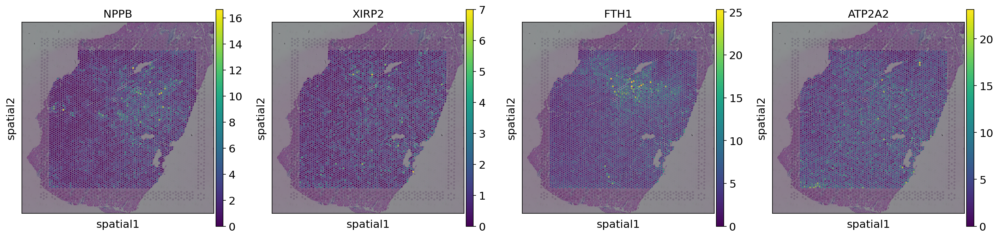

In [30]:
slide = c2l.utils.select_slide(adata_st, "control_P1", batch_key="patient_region_id")

with matplotlib.rc_context({"figure.figsize": [4.5, 5]}):
    sq.pl.spatial_scatter(
        slide,
        color=["NPPB", "XIRP2", "FTH1", "ATP2A2"],
        layer="Cardiomyocyte",
        alt_var="feature_name",
    )

#### Discrete tissue regions 

Based on the computed cell abundance estimated by cell2location, we can identify tissue regions with similar cell compositions. For this purpose we compute a KNN graph based on the 5% cell abundance and perform leiden clustering in the connectivities. The clustering is performed on all sections jointly to identify comparable tissue regions across samples. 

We save the resulting clustering in `adata_vis.obs['region_cluster']`.



In [31]:
sc.pp.neighbors(adata_st, use_rep="q05_cell_abundance_w_sf")
sc.tl.leiden(adata_st, resolution=0.5)
adata_st.obs["region_cluster"] = adata_st.obs["leiden"].astype("category")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


We now compute a UMAP using the KNN graph based on the cell2location output and visualize the identified tissue regions both in the UMAP and in space.

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


/home/icb/anna.schaar/miniconda3/envs/deconvolution_book/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


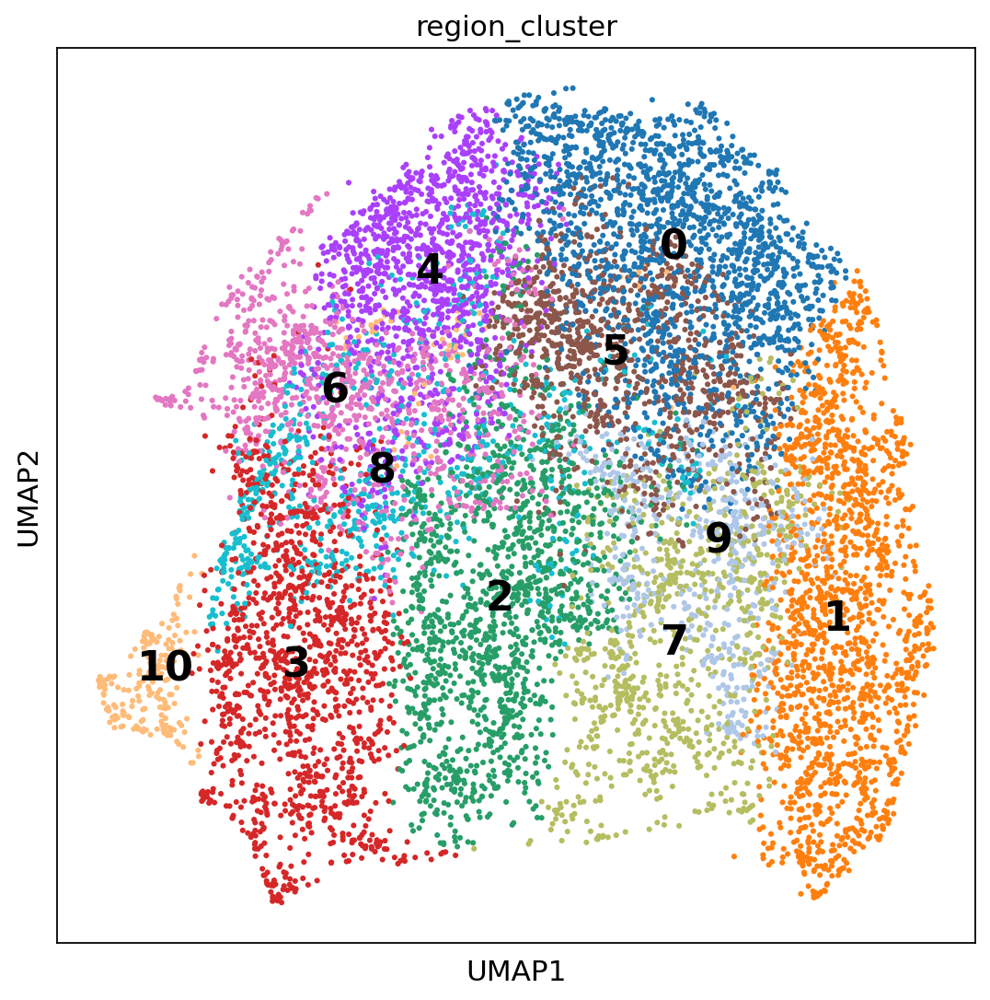

In [32]:
sc.tl.umap(adata_st, min_dist=0.3, spread=1)

with matplotlib.rc_context({"axes.facecolor": "white", "figure.figsize": [8, 8]}):
    sc.pl.umap(
        adata_st,
        color=["region_cluster"],
        size=30,
        color_map="RdPu",
        ncols=2,
        legend_loc="on data",
        legend_fontsize=20,
    )

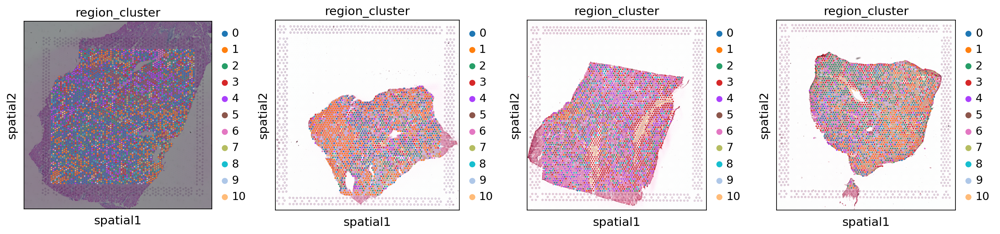

In [33]:
sq.pl.spatial_scatter(adata_st, color="region_cluster", library_key="patient_region_id")

## Further Models in Reference Based Deconvolution

DestVI {cite}`lopez_destvi_2022` incorporates complex nonlinear relationships into the latent variable setup through the use of neural networks. It is the first model that allows for variation of cell type expression prototypes in the data set through a latent variable. These concepts combine to parameterize the mean of a standard negative binomial distribution with gene dependent success probability $p_g$ as in Stereoscope.

RCTD {cite}`cable_robust_2022` is a reference based deconvolution model which uses the Poisson distribution instead of the more common negative binomial. For its reference cell type prototypes, it simply uses mean expressions for each cell type. This straightforward approach aims for maximum robustness and has shown particular promise in the deconvolution of cell doublets.

SPOTlight {cite}`elosua-bayes_spotlight_2021` uses non-negative matrix factorisation to first decompose the cells by genes matrix from a reference into two parts. First, a cells by topics matrix $H$ and a topics by genes matrix $W$. The matrix $W$ is then transferred to ST where a spots by topics matrix $H'$ is inferred. Topics are not exactly cell types and much care has to be put to ensure that correct latent features are modeled. 

## References

```{bibliography}
:filter: docname in docnames
:labelprefix: spatial
```

## Contributors
### Authors
* Leon Hetzel
* Anna Schaar

### Reviewers
* Lukas Heumos